# Decompress zipped image data

In [ ]:
import zipfile
import os
zipp = zipfile.ZipFile('/content/drive/MyDrive/E6893 Images/people3/people.zip', 'r')
zipp.extractall(os.getcwd())
zipp = zipfile.ZipFile('/content/drive/MyDrive/E6893 Images/anime2/anime2.zip', 'r')
zipp.extractall(os.getcwd())
zipp = zipfile.ZipFile('/content/drive/MyDrive/E6893.zip', 'r')
zipp.extractall(os.getcwd())
zipp.close()

Mounted at /content/drive


# pix2pix model building

In [ ]:
import tensorflow as tf
from matplotlib import pyplot as plt
from numpy import asarray
import numpy as np

import datetime
import time

import pandas as pd
from tqdm import tqdm

In [ ]:
############# change
IMG_WIDTH = 256
IMG_HEIGHT = 256

## process image

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
# this function convert the images to a tensor array, and matches a input images and a real image to a image pair.
def file_2_tfArray(numOfImage, file_names, path_input, path_output, height, width):
  i = 0
  for f in tqdm(file_names):      
      if f.startswith('._') or ('gif' in f):
        continue
      input_image = tf.io.read_file(os.path.join(path_input, f))
      input_image = tf.io.decode_image(input_image, channels= 3)
      input_image = tf.cast(input_image, tf.float32)
      
      real_image = tf.io.read_file(os.path.join(path_output, f))
      real_image = tf.io.decode_image(real_image, channels= 3)
      real_image = tf.cast(real_image, tf.float32)

      input_image, real_image = resize(input_image, real_image, height, width)

      image = tf.concat([input_image, real_image], axis=1)

      if i == 0:
          image_tensor_array = tf.constant(np.asarray([image]))
      else:
          image_tensor_array = tf.concat([image_tensor_array, np.asarray([image])],axis=0)

      ############# change
      if i == numOfImage - 1:
        break
      i += 1

  return image_tensor_array




In [ ]:
# this function convert the images to a tensor array, and matches a input images and a real image to a image pair.
def file_2_tfArray_landscape(numOfImage, file_names_input, file_names_output, path_input, path_output, height, width):
  i = 0
  for f1,f2 in tqdm(zip(file_names_input, file_names_output)):      
      input_image = tf.io.read_file(os.path.join(path_input, f1))
      input_image = tf.io.decode_image(input_image, channels= 3)
      input_image = tf.cast(input_image, tf.float32)
      
      real_image = tf.io.read_file(os.path.join(path_output, f2))
      real_image = tf.io.decode_image(real_image, channels= 3)
      real_image = tf.cast(real_image, tf.float32)

      input_image, real_image = resize(input_image, real_image, height, width)

      image = tf.concat([input_image, real_image], axis=1)

      if i == 0:
          image_tensor_array = tf.constant(np.asarray([image]))
      else:
          image_tensor_array = tf.concat([image_tensor_array, np.asarray([image])],axis=0)

      ############# change
      if i == numOfImage - 1:
        break
      i += 1

  return image_tensor_array




In [ ]:
# load, 作用是把图片左右两半分开，左边的图片是input image， 右边的图片是real image。
def load(image_array):
    seg = image_array.shape[1]
    seg //= 2
    input_image = image_array[:, :seg, :]
    real_image = image_array[:, seg:, :]

    ##############
    # input_image = tf.cast(input_image, tf.float32)
    # real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# 归一化, normalize, 使像素的值都在（-1，1）之间。
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  ############# change
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

In [ ]:
def load_image_train(image_array):
  input_image, real_image = load(image_array)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_array):
  input_image, real_image = load(image_array)
  ################
  # input_image, real_image = resize(input_image, real_image,
  #                                  IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image


## build generator

In [ ]:
############# change
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
def Generator():
  ############# change
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

## define generator loss

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

## build the discriminator

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  ############# change
  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

## define discriminator loss

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

## optimizers

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## generate images

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Target Image', 'Generated Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot. ####?????????
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
def generate_images_test(model, test_input, tar):
  ############# change
  # training=True or training=Fasle?
  prediction = model(test_input, training=True)

  display_list = []
  title = ['Input Image', 'Target Image', 'Generated Image']

  for j in range(8):
    plt.figure(figsize=(15, 15))
    display_list = [test_input[j], tar[j], prediction[j]]
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      # Getting the pixel values in the [0, 1] range to plot. ####?????????
      plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
    plt.show()

## checkpoint & for tensorboard

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
# checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
#                                  discriminator_optimizer=discriminator_optimizer,
#                                  generator=generator,
#                                  discriminator=discriminator)

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## training

In [ ]:
@tf.function ###### WHAT IS THIS????????
def train_step(input_image, target, step, steps_per_epoch, epochs):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True) ### where does the generator come from????????

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  
  ############# change 
  if (step + 1) % (steps_per_epoch*(epochs//5)) == 0:
    tf.print('step', (step+1), 'gen_total_loss:', gen_total_loss)
    tf.print('step', (step+1), 'gen_gan_loss:', gen_gan_loss)
    tf.print('step', (step+1), 'gen_l1_loss:', gen_l1_loss)
    tf.print('step', (step+1), 'disc_loss:', disc_loss)

  ############# change
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=(step + 1) // (steps_per_epoch*(epochs//10)))
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=(step + 1) // (steps_per_epoch*(epochs//10)))
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=(step + 1) // (steps_per_epoch*(epochs//10)))
    tf.summary.scalar('disc_loss', disc_loss, step=(step + 1) // (steps_per_epoch*(epochs//10)))

In [ ]:
def fit(train_ds, test_ds, steps, steps_per_epoch, epochs):

  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():

    train_step(input_image, target, step, steps_per_epoch, epochs)

    ############# change
    # show the generated images for every __ epochs 
    if (step+1) % (steps_per_epoch*(epochs//5)) == 0:

      print(f'step {step+1} finished')
      
      ############# change
      print(f'Time taken for {epochs//5} epochs: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      
      ############# change
      # Save (checkpoint) the model every __ steps
      checkpoint.save(file_prefix=checkpoint_prefix)

####### 改动较多

In [ ]:
def load_test(image_array):
    seg = image_array.shape[2]
    seg //= 2
    input_image = image_array[:, :, :seg, :]/255
    real_image = image_array[:, :, seg:, :]/255

    return input_image, real_image

# tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

# Training and saving models: Anime as an example

In [ ]:
############# change
path_output = '/content/anime2/color'
path_input = '/content/anime2/grey'
path_names = '/content/anime2/all_images.csv'
files = pd.read_csv(path_names).image_name

BUFFER_SIZE = 6500 # buffer size is the number of images to train.#####!!!!!!!!
TOTAL = 7744
BATCH_SIZE = 128
STEPS_PER_EPOCH = BUFFER_SIZE//BATCH_SIZE + 1
EPOCHS = 100
STEPS = STEPS_PER_EPOCH*EPOCHS

In [ ]:
############# change
train_image_tensor_array = file_2_tfArray(TOTAL, files, path_input, path_output, IMG_HEIGHT, IMG_WIDTH)
test_image_tensor_array = train_image_tensor_array[BUFFER_SIZE:]
train_image_tensor_array = train_image_tensor_array[:BUFFER_SIZE]

100%|█████████▉| 7743/7744 [01:54<00:00, 67.84it/s]


In [ ]:
print(train_image_tensor_array.shape)
print(test_image_tensor_array.shape)

(6500, 256, 512, 3)
(1244, 256, 512, 3)


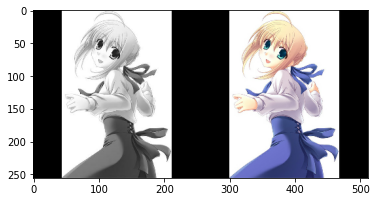

In [ ]:
plt.imshow(train_image_tensor_array[0]/255) ####?????????

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_image_tensor_array)

train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
train_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [ ]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_image_tensor_array)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)


In [ ]:
test_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [ ]:
generator = Generator()
discriminator = Discriminator()

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
# for example_input, example_target in test_dataset.take(1):
#   generate_images(generator, example_input, example_target)

step 1020 gen_total_loss: 11.6766472
step 1020 gen_gan_loss: 0.674991608
step 1020 gen_l1_loss: 0.110016555
step 1020 disc_loss: 1.32952917
step 1020 finished
Time taken for 20 epochs: 440.56 sec



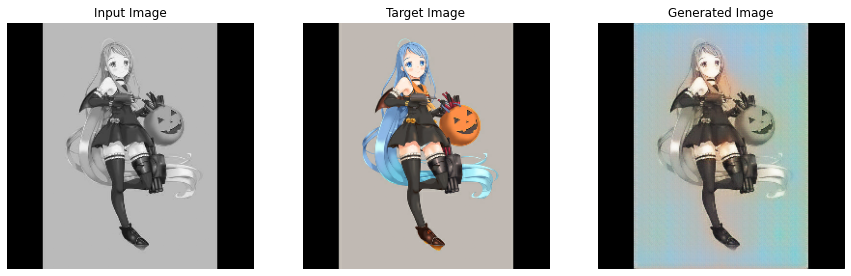

step 2040 gen_total_loss: 11.0604877
step 2040 gen_gan_loss: 0.249735162
step 2040 gen_l1_loss: 0.10810753
step 2040 disc_loss: 2.04119015
step 2040 finished
Time taken for 20 epochs: 408.86 sec



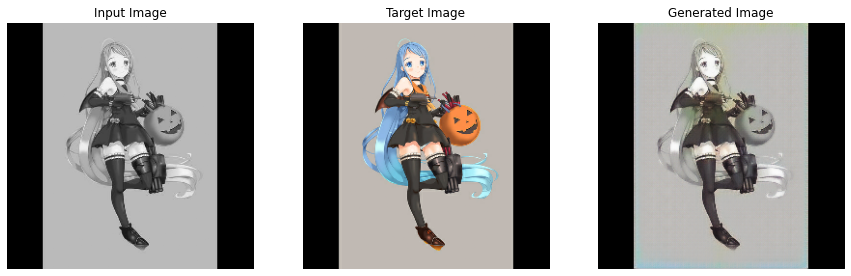

step 3060 gen_total_loss: 11.6853123
step 3060 gen_gan_loss: 0.664750814
step 3060 gen_l1_loss: 0.110205613
step 3060 disc_loss: 1.15261197
step 3060 finished
Time taken for 20 epochs: 408.80 sec



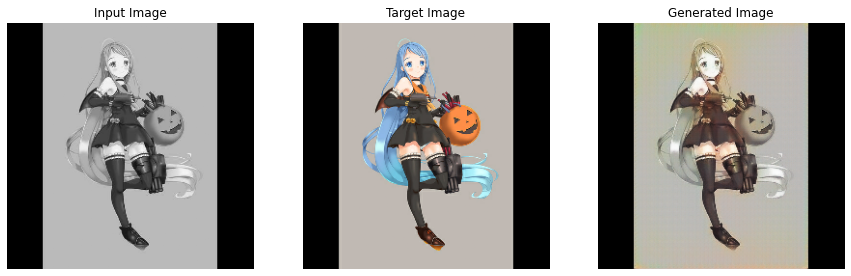

step 4080 gen_total_loss: 10.9100513
step 4080 gen_gan_loss: 0.871449471
step 4080 gen_l1_loss: 0.100386016
step 4080 disc_loss: 1.22048378
step 4080 finished
Time taken for 20 epochs: 409.04 sec



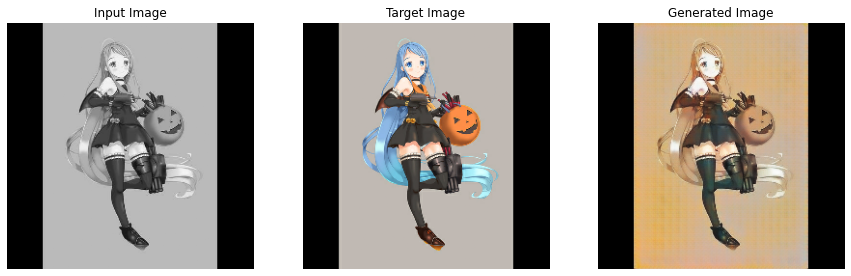

step 5100 gen_total_loss: 9.95493221
step 5100 gen_gan_loss: 0.951208949
step 5100 gen_l1_loss: 0.0900372267
step 5100 disc_loss: 1.32848048
step 5100 finished
Time taken for 20 epochs: 408.48 sec



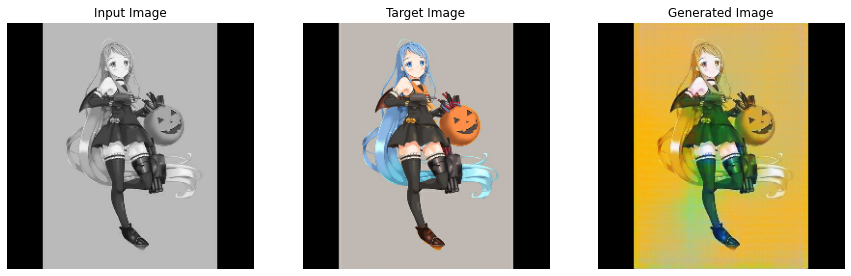

In [ ]:
############# change
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 0-100

In [ ]:
test_gray, test_color = load_test(test_image_tensor_array)
# gen_output = generator(test_gray, training=True)
# disc_generated_output = discriminator([test_gray, gen_output], training=True)
# total_gen_loss, gan_loss, l1_loss = generator_loss(disc_generated_output, gen_output, target=test_color)

generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 3s 37ms/step - loss: 0.1319 - acc: 0.3369


[0.1318792849779129, 0.3369024693965912]

step 1020 gen_total_loss: 9.63344288
step 1020 gen_gan_loss: 0.732113183
step 1020 gen_l1_loss: 0.0890133
step 1020 disc_loss: 1.16201591
step 1020 finished
Time taken for 20 epochs: 412.75 sec



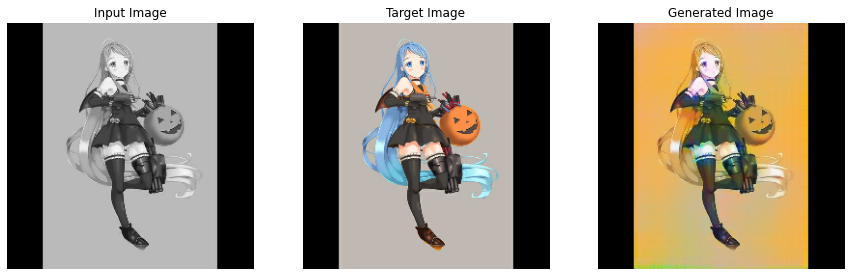

step 2040 gen_total_loss: 9.33690071
step 2040 gen_gan_loss: 1.27157462
step 2040 gen_l1_loss: 0.0806532577
step 2040 disc_loss: 1.28314424
step 2040 finished
Time taken for 20 epochs: 409.87 sec



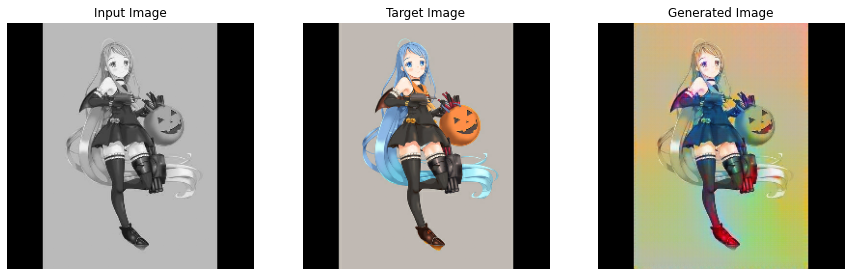

step 3060 gen_total_loss: 8.72879219
step 3060 gen_gan_loss: 0.958615601
step 3060 gen_l1_loss: 0.0777017623
step 3060 disc_loss: 1.0913403
step 3060 finished
Time taken for 20 epochs: 408.97 sec



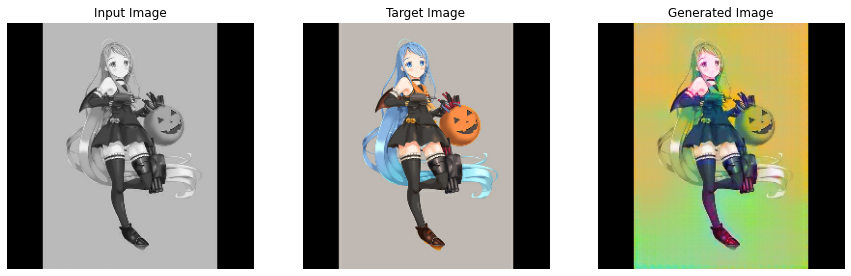

step 4080 gen_total_loss: 8.11103535
step 4080 gen_gan_loss: 0.673503697
step 4080 gen_l1_loss: 0.0743753165
step 4080 disc_loss: 1.35933948
step 4080 finished
Time taken for 20 epochs: 408.87 sec



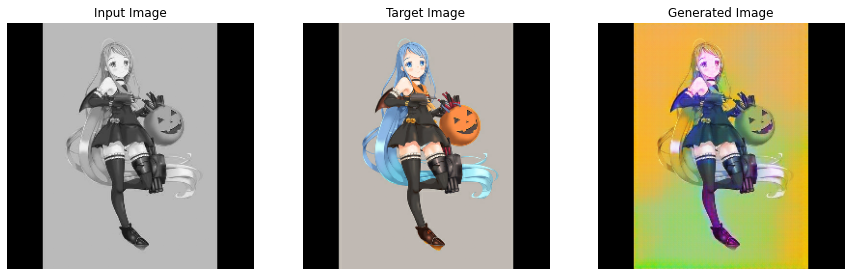

step 5100 gen_total_loss: 7.94514704
step 5100 gen_gan_loss: 0.541987836
step 5100 gen_l1_loss: 0.0740315914
step 5100 disc_loss: 1.37638259
step 5100 finished
Time taken for 20 epochs: 409.51 sec



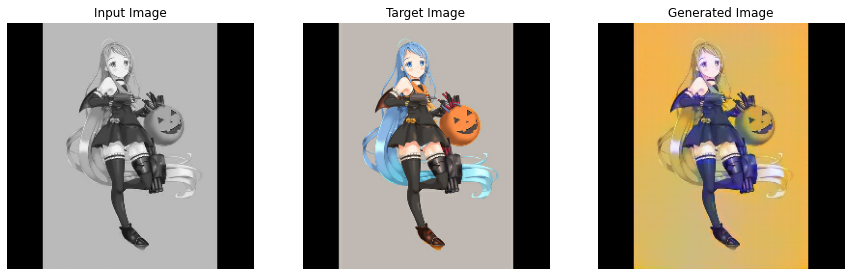

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 100-200

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 27ms/step - loss: 0.0902 - acc: 0.2935


[0.09023856371641159, 0.29351139068603516]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime200e.h5')

step 1020 gen_total_loss: 7.64150572
step 1020 gen_gan_loss: 0.720046639
step 1020 gen_l1_loss: 0.0692145899
step 1020 disc_loss: 1.04094768
step 1020 finished
Time taken for 20 epochs: 412.93 sec



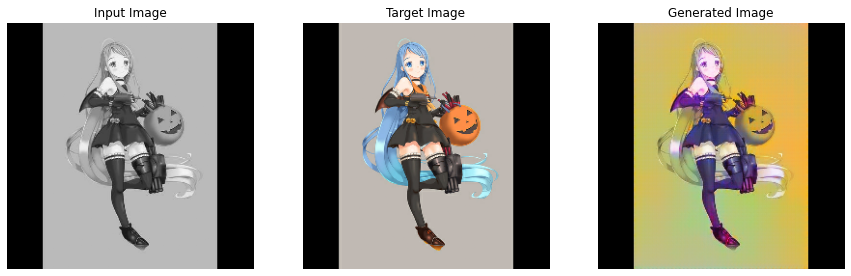

step 2040 gen_total_loss: 7.54724407
step 2040 gen_gan_loss: 0.855929852
step 2040 gen_l1_loss: 0.0669131428
step 2040 disc_loss: 1.20288444
step 2040 finished
Time taken for 20 epochs: 408.97 sec



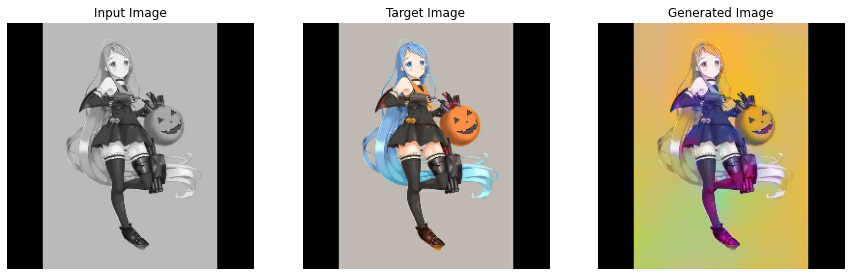

step 3060 gen_total_loss: 7.18518972
step 3060 gen_gan_loss: 0.662502944
step 3060 gen_l1_loss: 0.0652268678
step 3060 disc_loss: 1.49381709
step 3060 finished
Time taken for 20 epochs: 408.86 sec



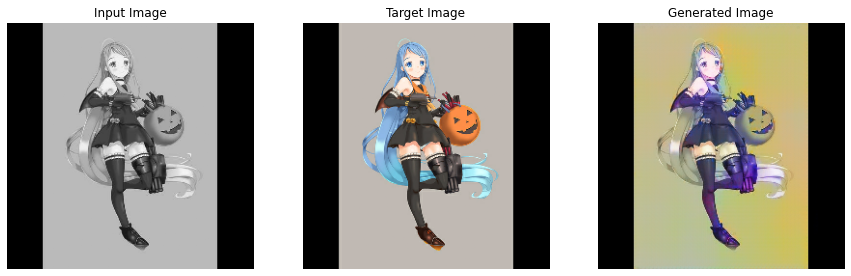

step 4080 gen_total_loss: 8.06571
step 4080 gen_gan_loss: 1.22121811
step 4080 gen_l1_loss: 0.0684449151
step 4080 disc_loss: 0.654201627
step 4080 finished
Time taken for 20 epochs: 408.77 sec



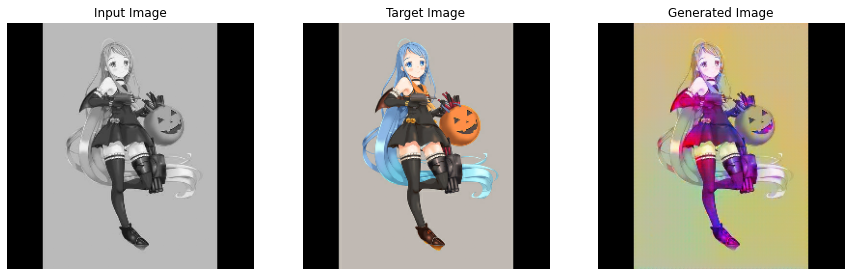

step 5100 gen_total_loss: 7.47830582
step 5100 gen_gan_loss: 0.805776417
step 5100 gen_l1_loss: 0.0667252913
step 5100 disc_loss: 1.121454
step 5100 finished
Time taken for 20 epochs: 409.17 sec



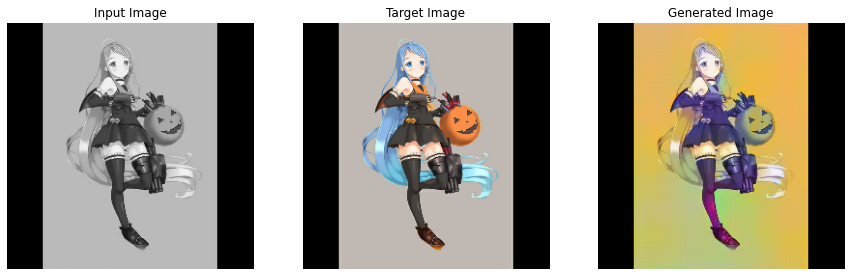

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 200-300

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 28ms/step - loss: 0.0914 - acc: 0.3268


[0.09142930805683136, 0.3267572820186615]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime300e.h5')

step 1020 gen_total_loss: 6.76898098
step 1020 gen_gan_loss: 0.774889767
step 1020 gen_l1_loss: 0.0599409118
step 1020 disc_loss: 1.40596461
step 1020 finished
Time taken for 20 epochs: 412.95 sec



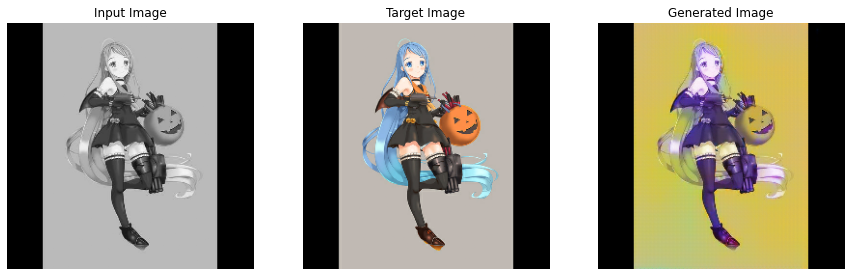

step 2040 gen_total_loss: 7.85653639
step 2040 gen_gan_loss: 1.60610282
step 2040 gen_l1_loss: 0.0625043362
step 2040 disc_loss: 1.02933717
step 2040 finished
Time taken for 20 epochs: 408.74 sec



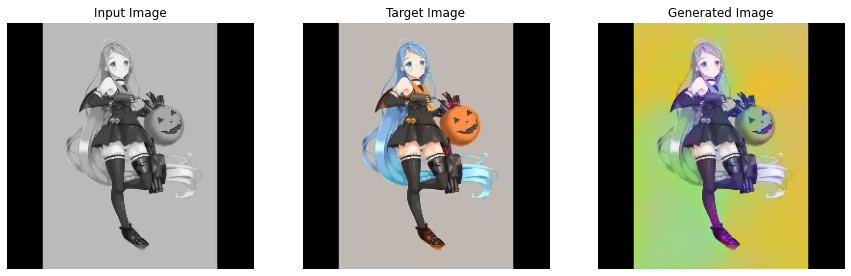

step 3060 gen_total_loss: 6.51811838
step 3060 gen_gan_loss: 0.765909374
step 3060 gen_l1_loss: 0.057522092
step 3060 disc_loss: 1.18803978
step 3060 finished
Time taken for 20 epochs: 408.02 sec



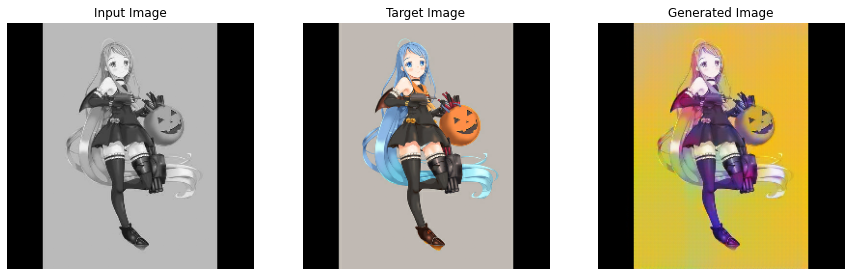

step 4080 gen_total_loss: 6.64751244
step 4080 gen_gan_loss: 1.17899275
step 4080 gen_l1_loss: 0.0546851978
step 4080 disc_loss: 0.905148387
step 4080 finished
Time taken for 20 epochs: 408.87 sec



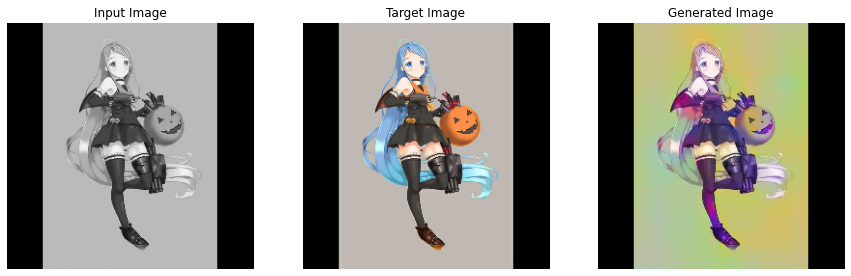

step 5100 gen_total_loss: 6.93908882
step 5100 gen_gan_loss: 0.881424665
step 5100 gen_l1_loss: 0.0605766438
step 5100 disc_loss: 1.14604318
step 5100 finished
Time taken for 20 epochs: 409.06 sec



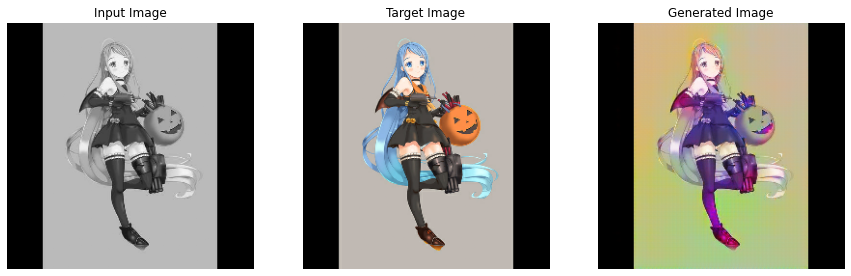

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 300-400

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 27ms/step - loss: 0.0956 - acc: 0.3820


[0.0955861434340477, 0.3820114731788635]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime400e.h5')

step 1020 gen_total_loss: 6.00547
step 1020 gen_gan_loss: 0.511378407
step 1020 gen_l1_loss: 0.0549409166
step 1020 disc_loss: 1.29629111
step 1020 finished
Time taken for 20 epochs: 412.06 sec



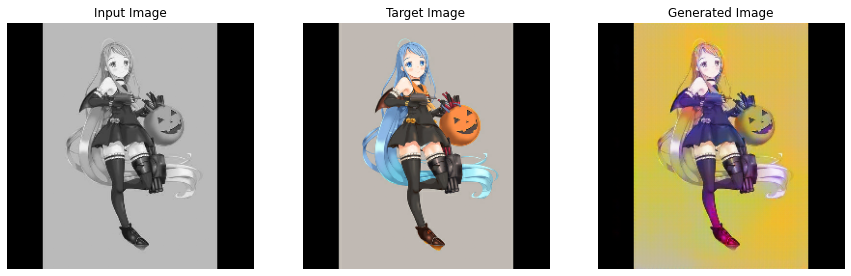

step 2040 gen_total_loss: 6.41375685
step 2040 gen_gan_loss: 0.673217595
step 2040 gen_l1_loss: 0.0574053898
step 2040 disc_loss: 1.08774233
step 2040 finished
Time taken for 20 epochs: 408.68 sec



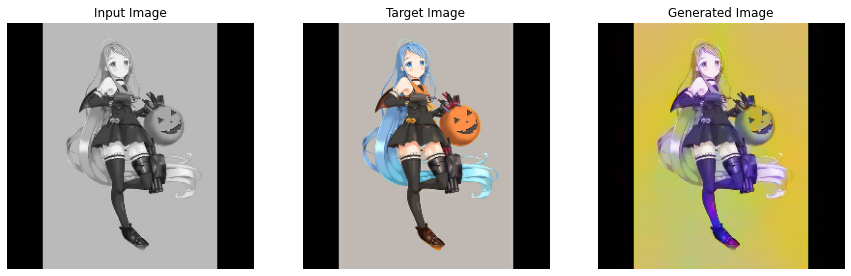

step 3060 gen_total_loss: 8.48226
step 3060 gen_gan_loss: 2.85371399
step 3060 gen_l1_loss: 0.0562854558
step 3060 disc_loss: 0.241409302
step 3060 finished
Time taken for 20 epochs: 408.60 sec



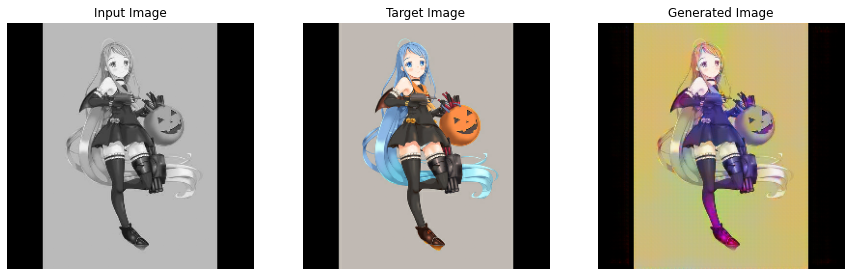

step 4080 gen_total_loss: 6.22610092
step 4080 gen_gan_loss: 0.471114933
step 4080 gen_l1_loss: 0.0575498566
step 4080 disc_loss: 1.30580342
step 4080 finished
Time taken for 20 epochs: 408.66 sec



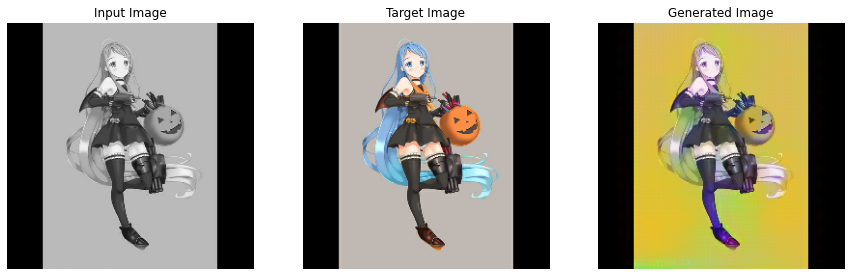

step 5100 gen_total_loss: 7.02450657
step 5100 gen_gan_loss: 1.32229948
step 5100 gen_l1_loss: 0.0570220686
step 5100 disc_loss: 1.58473086
step 5100 finished
Time taken for 20 epochs: 408.34 sec



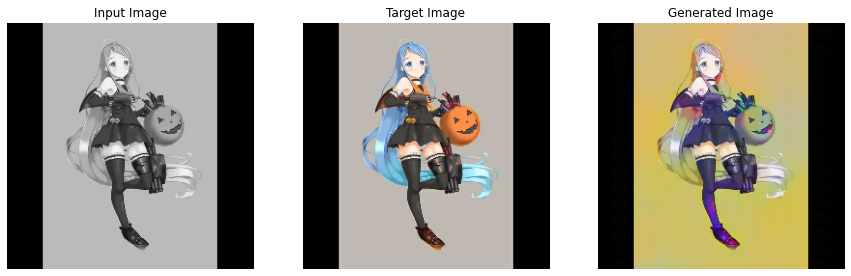

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 400-500

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 27ms/step - loss: 0.0869 - acc: 0.3848


[0.08687648177146912, 0.3848016858100891]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime500e.h5')

step 1020 gen_total_loss: 5.69933033
step 1020 gen_gan_loss: 0.189081207
step 1020 gen_l1_loss: 0.0551024899
step 1020 disc_loss: 2.16917682
step 1020 finished
Time taken for 20 epochs: 412.08 sec



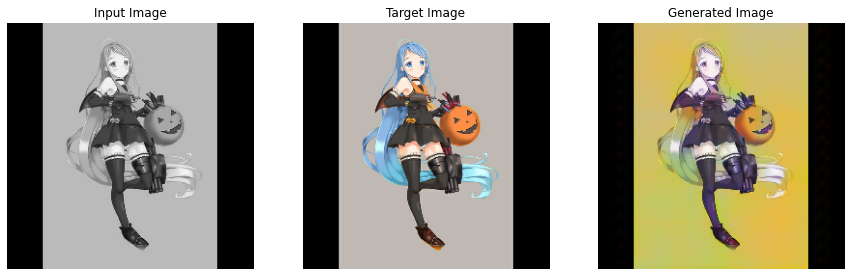

step 2040 gen_total_loss: 6.52042055
step 2040 gen_gan_loss: 1.09951556
step 2040 gen_l1_loss: 0.0542090535
step 2040 disc_loss: 1.10089207
step 2040 finished
Time taken for 20 epochs: 408.16 sec



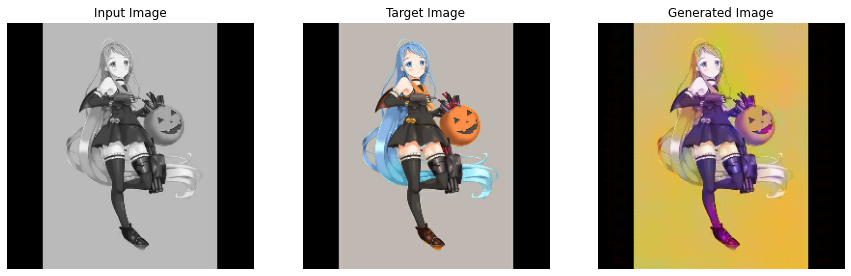

step 3060 gen_total_loss: 6.17702866
step 3060 gen_gan_loss: 0.520040572
step 3060 gen_l1_loss: 0.0565698817
step 3060 disc_loss: 1.67828095
step 3060 finished
Time taken for 20 epochs: 408.43 sec



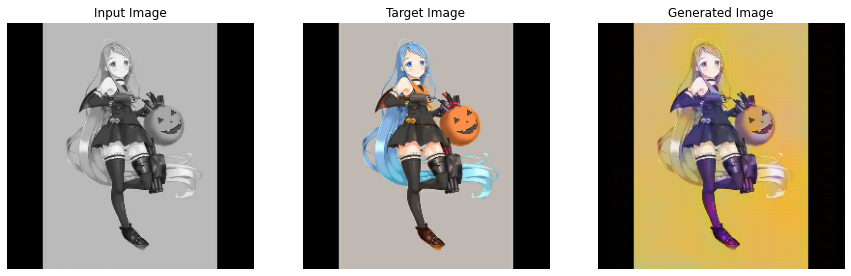

step 4080 gen_total_loss: 8.73195267
step 4080 gen_gan_loss: 2.73637438
step 4080 gen_l1_loss: 0.0599557869
step 4080 disc_loss: 0.447937489
step 4080 finished
Time taken for 20 epochs: 408.29 sec



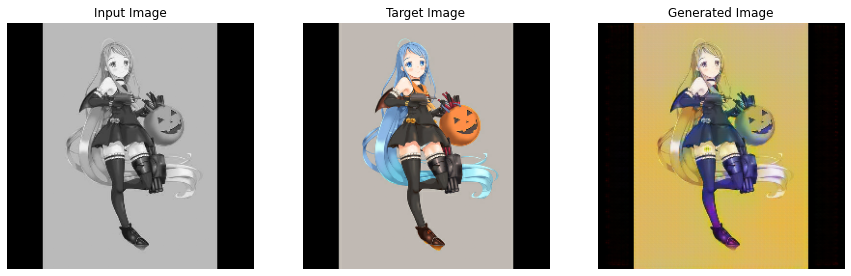

step 5100 gen_total_loss: 7.87059593
step 5100 gen_gan_loss: 2.32207918
step 5100 gen_l1_loss: 0.0554851666
step 5100 disc_loss: 0.206136197
step 5100 finished
Time taken for 20 epochs: 408.12 sec



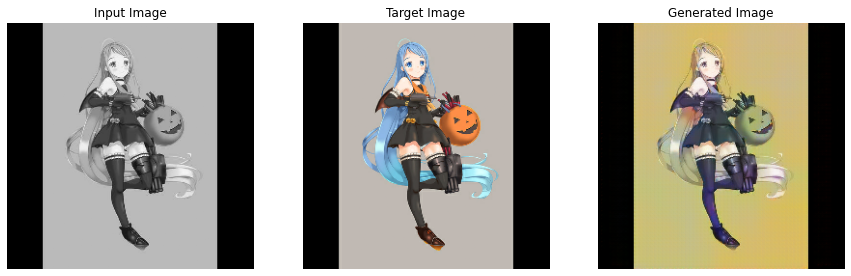

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 500-600

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 27ms/step - loss: 0.0868 - acc: 0.2839


[0.08684368431568146, 0.28392282128334045]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime600e.h5')

step 1020 gen_total_loss: 10.4269381
step 1020 gen_gan_loss: 4.43145657
step 1020 gen_l1_loss: 0.0599548146
step 1020 disc_loss: 0.135072649
step 1020 finished
Time taken for 20 epochs: 411.77 sec



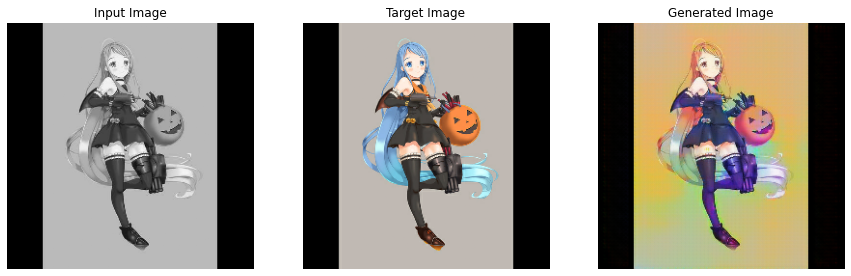

step 2040 gen_total_loss: 6.47907162
step 2040 gen_gan_loss: 0.961209714
step 2040 gen_l1_loss: 0.0551786162
step 2040 disc_loss: 0.660074
step 2040 finished
Time taken for 20 epochs: 409.23 sec



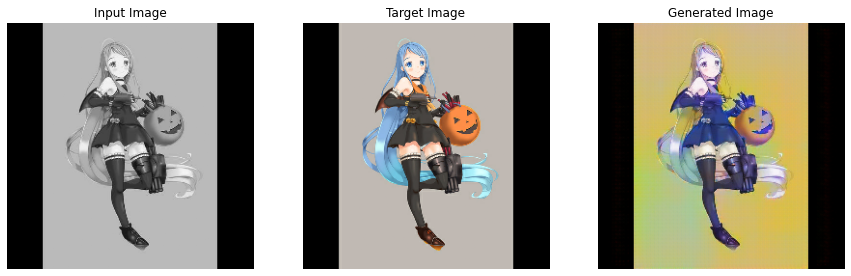

step 3060 gen_total_loss: 7.48231506
step 3060 gen_gan_loss: 1.80973625
step 3060 gen_l1_loss: 0.0567257889
step 3060 disc_loss: 0.507245421
step 3060 finished
Time taken for 20 epochs: 408.62 sec



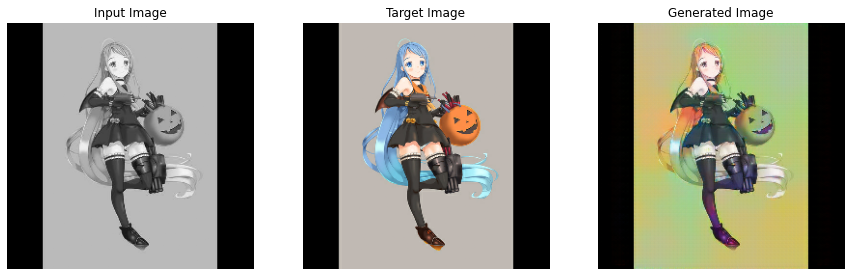

step 4080 gen_total_loss: 6.62776518
step 4080 gen_gan_loss: 0.879431427
step 4080 gen_l1_loss: 0.0574833378
step 4080 disc_loss: 0.760396302
step 4080 finished
Time taken for 20 epochs: 408.41 sec



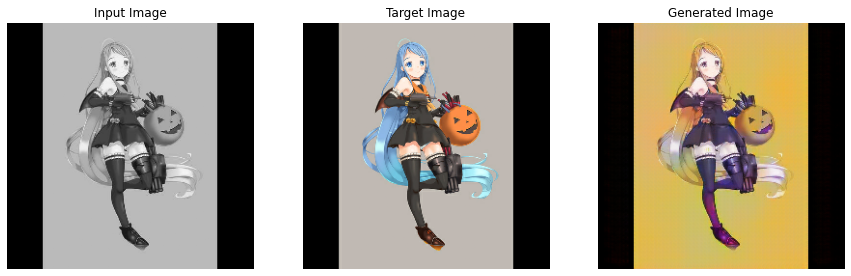

step 5100 gen_total_loss: 10.5196218
step 5100 gen_gan_loss: 3.76321316
step 5100 gen_l1_loss: 0.0675640851
step 5100 disc_loss: 0.0494296178
step 5100 finished
Time taken for 20 epochs: 408.29 sec



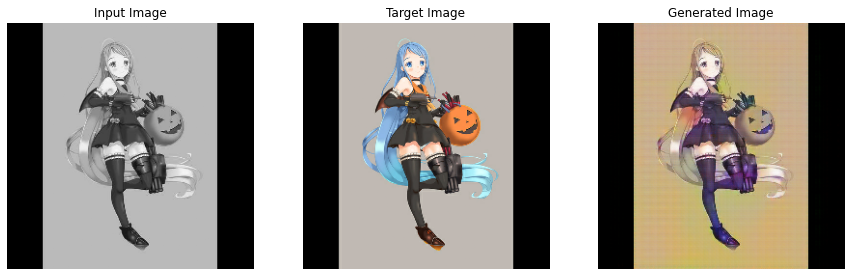

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 600-700

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 28ms/step - loss: 0.0968 - acc: 0.5220


[0.09675824642181396, 0.5220187902450562]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime700e.h5')

step 1020 gen_total_loss: 7.67094898
step 1020 gen_gan_loss: 2.29917789
step 1020 gen_l1_loss: 0.0537177138
step 1020 disc_loss: 0.299854159
step 1020 finished
Time taken for 20 epochs: 412.51 sec



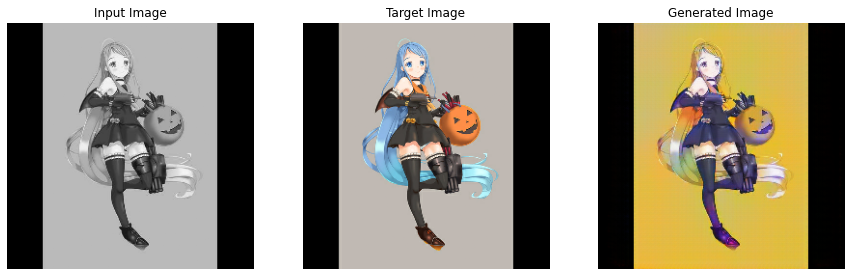

step 2040 gen_total_loss: 6.70099688
step 2040 gen_gan_loss: 0.653734624
step 2040 gen_l1_loss: 0.0604726225
step 2040 disc_loss: 1.09985113
step 2040 finished
Time taken for 20 epochs: 408.17 sec



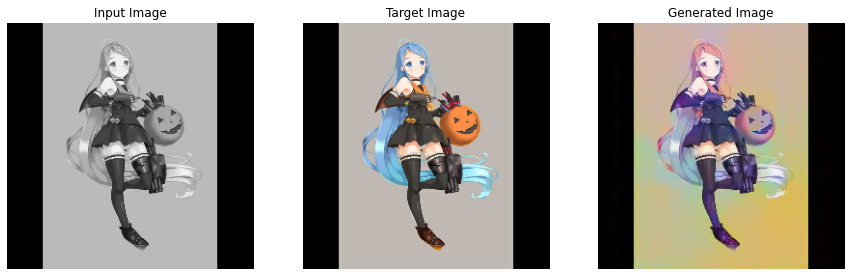

step 3060 gen_total_loss: 9.97732162
step 3060 gen_gan_loss: 4.00393343
step 3060 gen_l1_loss: 0.0597338788
step 3060 disc_loss: 0.0340671241
step 3060 finished
Time taken for 20 epochs: 408.37 sec



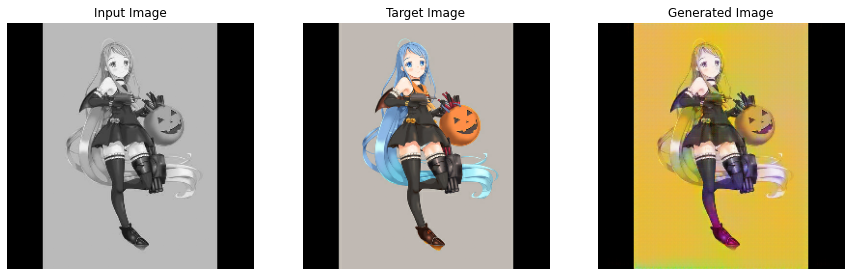

step 4080 gen_total_loss: 13.2513905
step 4080 gen_gan_loss: 7.19113588
step 4080 gen_l1_loss: 0.0606025495
step 4080 disc_loss: 0.0186642967
step 4080 finished
Time taken for 20 epochs: 408.39 sec



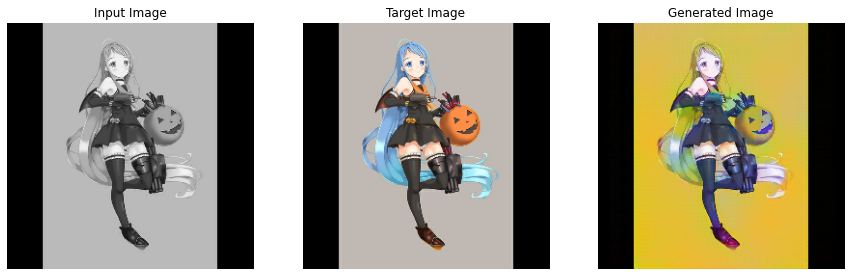

step 5100 gen_total_loss: 8.85000229
step 5100 gen_gan_loss: 3.32742524
step 5100 gen_l1_loss: 0.0552257746
step 5100 disc_loss: 0.136690676
step 5100 finished
Time taken for 20 epochs: 408.31 sec



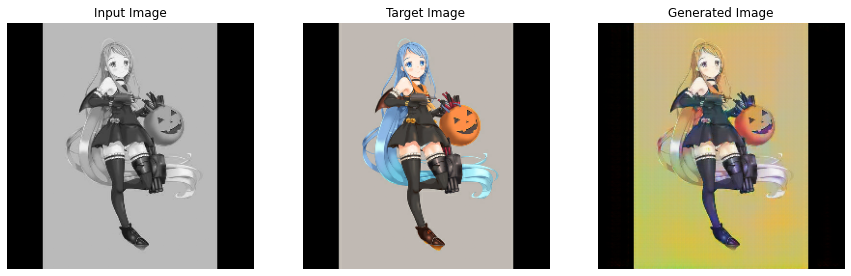

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 700-800

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 28ms/step - loss: 0.0870 - acc: 0.4741


[0.08702884614467621, 0.4740871787071228]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime800e.h5')

In [ ]:
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

step 1020 gen_total_loss: 5.81184578
step 1020 gen_gan_loss: 0.529974282
step 1020 gen_l1_loss: 0.0528187118
step 1020 disc_loss: 1.3540951
step 1020 finished
Time taken for 20 epochs: 415.17 sec



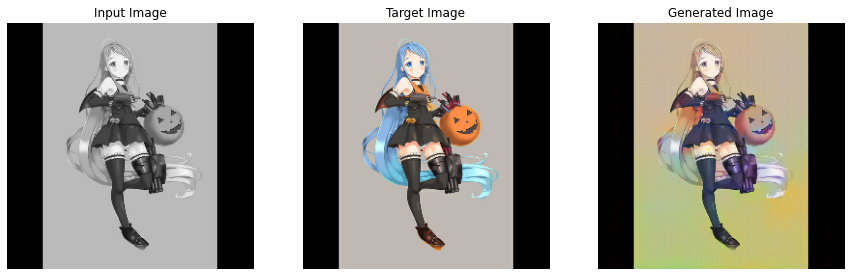

step 2040 gen_total_loss: 13.040822
step 2040 gen_gan_loss: 7.40933466
step 2040 gen_l1_loss: 0.0563148744
step 2040 disc_loss: 0.00814186409
step 2040 finished
Time taken for 20 epochs: 408.55 sec



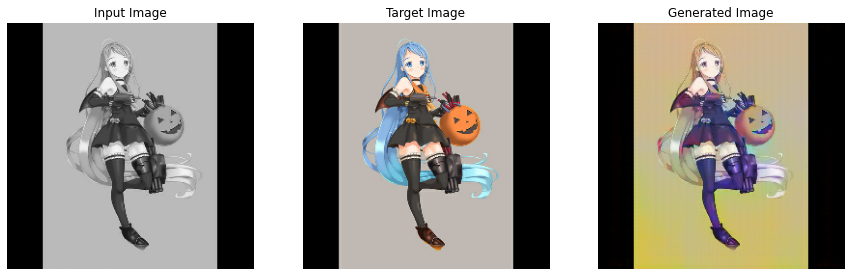

step 3060 gen_total_loss: 9.39746952
step 3060 gen_gan_loss: 3.97828221
step 3060 gen_l1_loss: 0.0541918762
step 3060 disc_loss: 0.0424278527
step 3060 finished
Time taken for 20 epochs: 408.62 sec



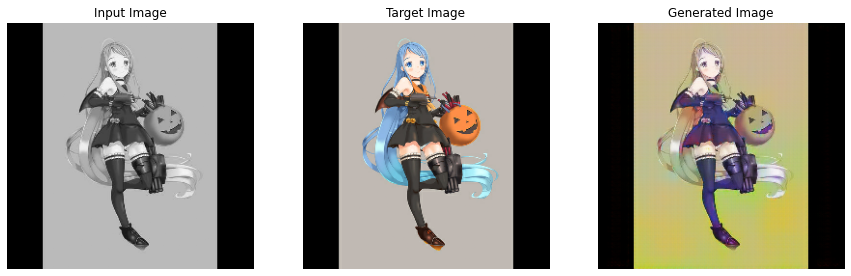

step 4080 gen_total_loss: 9.39923286
step 4080 gen_gan_loss: 4.26499844
step 4080 gen_l1_loss: 0.051342342
step 4080 disc_loss: 0.0603160299
step 4080 finished
Time taken for 20 epochs: 409.21 sec



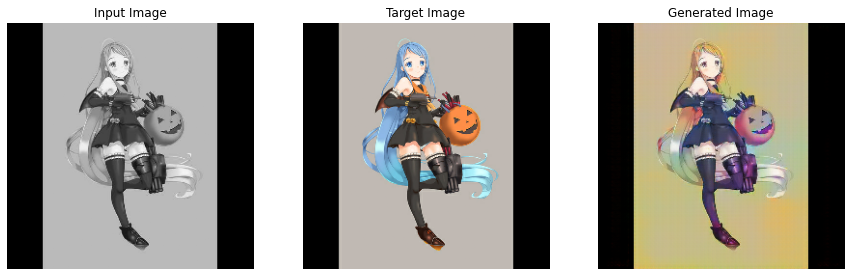

step 5100 gen_total_loss: 6.20800066
step 5100 gen_gan_loss: 0.89038533
step 5100 gen_l1_loss: 0.0531761535
step 5100 disc_loss: 1.12544179
step 5100 finished
Time taken for 20 epochs: 409.15 sec



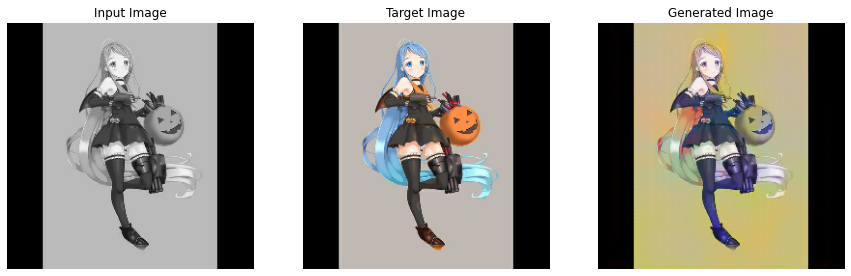

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 800-900

In [ ]:
test_gray, test_color = load_test(test_image_tensor_array)

generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 3s 38ms/step - loss: 0.0874 - acc: 0.4739


[0.08736714720726013, 0.47390463948249817]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime900e.h5')

step 1020 gen_total_loss: 8.3336916
step 1020 gen_gan_loss: 3.11011934
step 1020 gen_l1_loss: 0.0522357225
step 1020 disc_loss: 0.124547422
step 1020 finished
Time taken for 20 epochs: 412.74 sec



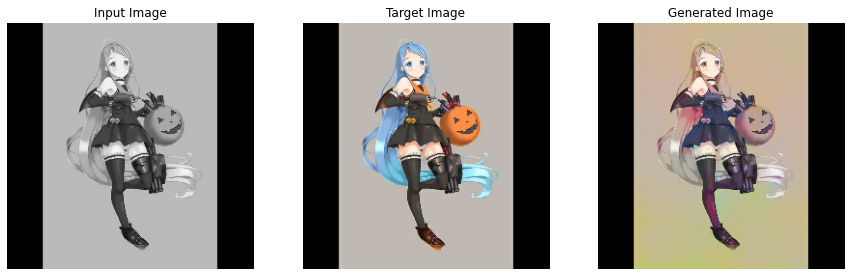

step 2040 gen_total_loss: 9.24337387
step 2040 gen_gan_loss: 4.19411802
step 2040 gen_l1_loss: 0.0504925586
step 2040 disc_loss: 0.369960248
step 2040 finished
Time taken for 20 epochs: 407.91 sec



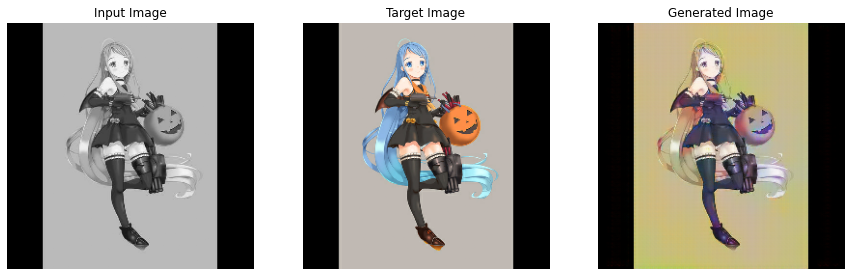

step 3060 gen_total_loss: 11.1083488
step 3060 gen_gan_loss: 5.64356804
step 3060 gen_l1_loss: 0.0546478145
step 3060 disc_loss: 0.0507289134
step 3060 finished
Time taken for 20 epochs: 408.23 sec



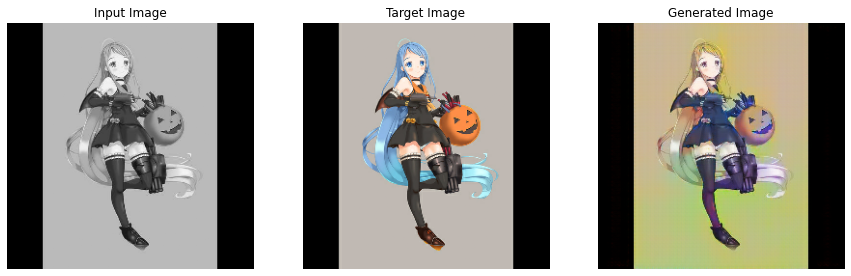

step 4080 gen_total_loss: 5.87105846
step 4080 gen_gan_loss: 1.07303214
step 4080 gen_l1_loss: 0.0479802601
step 4080 disc_loss: 0.815064728
step 4080 finished
Time taken for 20 epochs: 408.03 sec



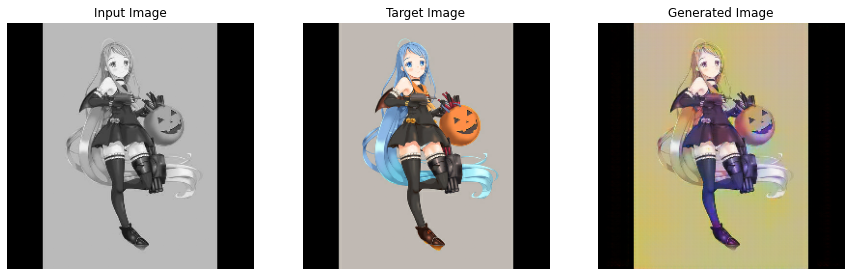

step 5100 gen_total_loss: 10.5358391
step 5100 gen_gan_loss: 5.32173252
step 5100 gen_l1_loss: 0.0521410704
step 5100 disc_loss: 0.137109771
step 5100 finished
Time taken for 20 epochs: 407.96 sec



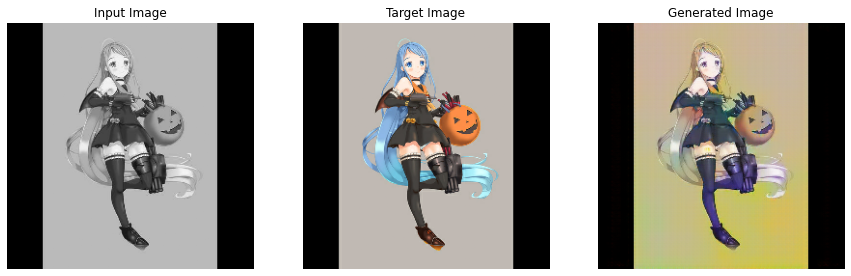

In [ ]:
fit(train_dataset, test_dataset, STEPS, STEPS_PER_EPOCH, EPOCHS)
# 900-1000

In [ ]:
generator.compile(optimizer = generator_optimizer, loss = 'mean_absolute_error',
              metrics = ['acc'])

generator.evaluate(test_gray, test_color)

39/39 [==============================] - 2s 27ms/step - loss: 0.0877 - acc: 0.4734


[0.08767984807491302, 0.4733605980873108]

In [ ]:
# save the models
generator.save('/content/drive/MyDrive/Colab Notebooks/model_anime1000e.h5')

## save discriminator and optimizers

In [ ]:
# np.save('/content/drive/MyDrive/Colab Notebooks/anime1000_gweights.npy', generator_optimizer.get_weights())
# np.save('/content/drive/MyDrive/Colab Notebooks/anime1000_dweights.npy', discriminator_optimizer.get_weights())

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [ ]:
# discriminator.save('/content/drive/MyDrive/Colab Notebooks/discriminator_anime1000e.h5')

In [ ]:
generator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/model_anime1000e.h5')
discriminator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/discriminator_anime1000e.h5')

gopt_weights = np.load('/content/drive/MyDrive/Colab Notebooks/anime1000_gweights.npy', allow_pickle=True)
dopt_weights = np.load('/content/drive/MyDrive/Colab Notebooks/anime1000_dweights.npy', allow_pickle=True)

ggrad_vars = generator.trainable_weights
dgrad_vars = discriminator.trainable_weights
# This need not be model.trainable_weights; it must be a correctly-ordered list of 
# grad_vars corresponding to how you usually call the optimizer.

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


#### g
zero_grads = [tf.zeros_like(w) for w in ggrad_vars]

# Apply gradients which don't do nothing with Adam
generator_optimizer.apply_gradients(zip(zero_grads, ggrad_vars))

# Set the weights of the optimizer
generator_optimizer.set_weights(gopt_weights)

# NOW set the trainable weights of the model
# generator_weights = np.load('/path/to/saved/model/weights.npy', allow_pickle=True)
# generator.set_weights(generator_weights)
generator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/model_anime1000e.h5')



#### d
zero_grads = [tf.zeros_like(w) for w in dgrad_vars]

# Apply gradients which don't do nothing with Adam
discriminator_optimizer.apply_gradients(zip(zero_grads, dgrad_vars))

# Set the weights of the optimizer
discriminator_optimizer.set_weights(dopt_weights)

# NOW set the trainable weights of the model
discriminator = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/discriminator_anime1000e.h5')

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)